In [1]:
import numpy as np
import os
import time
import scipy
import glob
import sys
from datetime import datetime

import pandas as pd
from scipy.stats import binned_statistic_2d
import scipy.stats as sts

import matplotlib as mpl
mpl.use('nbagg')
import seaborn as sns
import pylab as pl

import importlib

import pandas as pd
# from scipy.stats import binned_statistic_2d

# import some custom funcs
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import utils as util
import behavior as butil

In [10]:
util.set_sns_style(style='dark')
%matplotlib notebook

In [3]:
root_dir = '/Users/julianarhee/Library/CloudStorage/GoogleDrive-edge.tracking.ru@gmail.com/My Drive/Edge_Tracking/Data'
root_dir = os.path.join(root_dir, 'jyr')
#experiment = 'vertical_strip/paired_experiments' 
experiment = 'gradient_vs_constant-odor' 
# experiment = 'reverse gradient' 

strip_width = 50
strip_sep = 200
fig_id = os.path.join(root_dir.split('/My Drive')[1], experiment)
src_dir = os.path.join(root_dir, experiment)
save_dir = '/Users/julianarhee/Documents/rutalab/data/figures/{}'.format(experiment)
save_dir = save_dir.replace(" ", "")

print("Saving figures to:{}    {}".format('\n', save_dir))
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

Saving figures to:
    /Users/julianarhee/Documents/rutalab/data/figures/gradient_vs_constant-odor


In [4]:
outstrip_c = [0.7]*3
instrip_c = 'r'

instrip_palette={True: instrip_c, False: outstrip_c}
grad_palette = {'constant': 'w', 'gradient': 'gray', }


In [5]:
importlib.reload(butil)
importlib.reload(util)

<module 'utils' from '/Users/julianarhee/Repositories/plume-tracking/utils.py'>

In [6]:
# log_files = sorted([k for k in glob.glob(os.path.join(src_dir, 'raw', '*.log'))\
#                 if 'lossed tracking' not in k], key=util.natsort)
# print("Found {} tracking files.".format(len(log_files)))
log_files = butil.get_log_files(src_dir, verbose=False)

Found 31 tracking files.


In [7]:
# # Load dataframes
df0_all = butil.load_combined_df(os.path.join(src_dir, 'raw'), save=True, 
                                 create_new=False, remove_invalid=True, process=True)
condition_list = df0_all['condition'].unique()
print("There are {} unique conditions:".format(len(condition_list)))
for ci, cond in enumerate(condition_list):
    print(ci, cond)  

loading existing combined df
There are 4 unique conditions:
0 constantodor1
1 constantodor2
2 gradient1
3 gradient2


In [8]:
if experiment=='reverse gradient':
    gdf0_all.loc[df0_all['condition']=='cantons_constantodor', 'condition'] = 'constantodor'
    df0_all.loc[df0_all['condition']=='cantons_reversegradient', 'condition'] = 'reversegradient'
    df0_all.loc[df0_all['condition']=='cantons_contantodor', 'condition'] = 'constantodor'
    condition_list = df0_all['condition'].unique()
    for ci, cond in enumerate(condition_list):
        print(ci, cond) 

#### flip paths to border along strip's RIGHT edge

In [9]:
d_list=[]
borders = {}
for trial_id, df_ in df0_all.groupby('trial_id'):
    fp_, borders_fp = butil.check_entryside_and_flip(df_, strip_width=strip_width)
    d_list.append(fp_)
    borders.update({trial_id: borders_fp})
    #print(trial_id, entry_left_edge)
df_fp = pd.concat(d_list)
# borders

... Using default odor min/max, animal did not move in odor


<IPython.core.display.Javascript object>


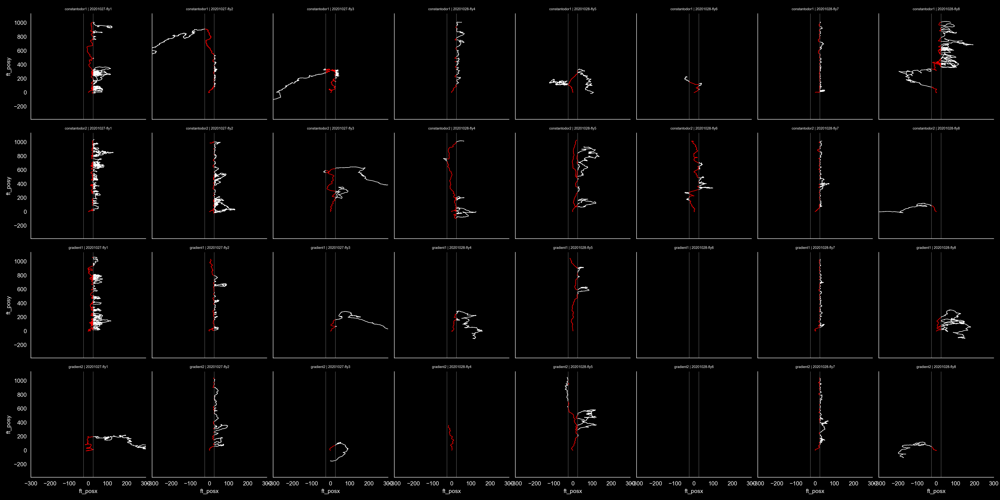

/Users/julianarhee/Documents/rutalab/data/figures/gradient_vs_constant-odor


In [234]:
fig = butil.plot_fly_by_condition(df_fp, hue_varname='instrip')
pl.savefig(os.path.join(save_dir, 'traj-flipped.png'))
print(save_dir)

### Adjust some vars

In [235]:
df_fp['fly_id'].unique()

array(['20201027-fly1', '20201027-fly2', '20201027-fly3', '20201028-fly4',
       '20201028-fly5', '20201028-fly6', '20201028-fly7', '20201028-fly8'],
      dtype=object)

In [236]:
excl_flies = ['20201028-fly4', '20201028-fly6']

df0 = df_fp[~df_fp['fly_id'].isin(excl_flies)].copy()
df0.loc[df0['condition'].isin(['constantodor1', 'constantodor2']), 'strip_type'] = 'constant'
df0.loc[df0['condition'].isin(['gradient1', 'gradient2']), 'strip_type'] = 'gradient'
df0.loc[df0['instrip'], 'bout_type'] = 'instrip'
df0.loc[~df0['instrip'], 'bout_type'] = 'outstrip'
df0['inout-strip'] = ['{}-{}'.format(v1, v2) for v1, v2 \
                         in df0[['strip_type', 'bout_type']].values]
#metrics = df0.groupby(['fly_id', 'condition', 'boutnum']).apply(butil.get_bout_metrics).reset_index()
#metrics.head()

In [239]:
metrics = df0.groupby(['fly_id', 'condition', 'boutnum']).apply(butil.get_bout_metrics).reset_index()
metrics.columns

Index(['fly_id', 'condition', 'boutnum', 'level_3', 'duration',
       'upwind_dist_range', 'upwind_dist_firstlast', 'crosswind_dist_range',
       'crosswind_dist_firstlast', 'path_length', 'average_heading',
       'rel_time', 'speed', 'upwind_speed', 'crosswind_speed', 'mfc1_stpt',
       'mfc2_stpt', 'mfc3_stpt', 'led1_stpt', 'filename', 'date', 'instrip',
       'led_on', 'experiment', 'fly_name', 'trial', 'trial_id', 'flipped',
       'strip_type', 'bout_type', 'inout-strip', 'led2_stpt',
       'motor_step_command'],
      dtype='object')

In [240]:
importlib.reload(butil)

<module 'behavior' from '/Users/julianarhee/Repositories/plume-tracking/behavior.py'>

<IPython.core.display.Javascript object>


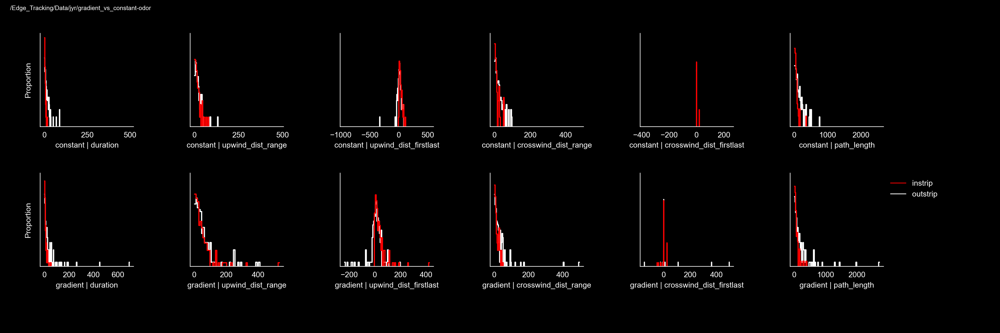

/Users/julianarhee/Repositories/plume-tracking/behavior.py:2010: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels()) #, fontsize=fontsize)
/Users/julianarhee/Repositories/plume-tracking/behavior.py:2011: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels()) #, fontsize=fontsize)


/Users/julianarhee/Documents/rutalab/data/figures/gradient_vs_constant-odor hist-metrics_bout_type_strip_type_log


In [248]:
# outstrip_c = [0.7]*3
# instrip_c = 'r'
curr_palette = instrip_palette
hue_var='bout_type'
row_var='strip_type'
labels = ['instrip', 'outstrip'] if hue_var=='bout_type' else ['constant', 'gradient']
colors = ['r', 'w'] if hue_var=='bout_type' else ['w', 'c'] 
cumulative=False

plot_type = 'ecdf' if cumulative else 'hist'
stat='probability'
plot_log = True
if plot_log:
    cumulative = False
limit_xaxis = True #@not plot_log
# ----
plot_vars = ['duration', 'upwind_dist_range', 'upwind_dist_firstlast', \
             'crosswind_dist_range', 'crosswind_dist_firstlast', 'path_length']
if cumulative:
    fig = butil.plot_metrics_displot(metrics, plot_vars, hue_var=hue_var, row_var=row_var,
                    labels=labels, colors=colors)
else:
    fig = butil.plot_metrics_hist(metrics, plot_vars, hue_var=hue_var, row_var=row_var,
                             labels=labels, colors=colors, cumulative=cumulative, 
                                  stat=stat, plot_log=plot_log)
pl.tight_layout()
pl.subplots_adjust(top=0.9, hspace=0.5, right=0.9, bottom=0.2)
util.label_figure(fig, fig_id)
figname = '{}-metrics_{}_{}'.format(plot_type, hue_var, row_var)
figname = '{}_log'.format(figname) if plot_log else figname
pl.savefig(os.path.join(save_dir, '{}.png'.format(figname)))
print(save_dir, figname)

In [249]:
importlib.reload(butil)

<module 'behavior' from '/Users/julianarhee/Repositories/plume-tracking/behavior.py'>

In [250]:
ign_cols = ['experiment', 'fly_name', 'trial', 'motor_step_command', 'led2_stpt', 'level_3',
           'mfc1_stpt', 'mfc2_stpt', 'mfc3_stpt', 'led1_stpt', 'date']
quant_cols = [c for c in metrics.columns if c not in ign_cols]
qmetrics = metrics[quant_cols].copy()
quant_grouper = ['fly_id', 'trial_id', 'instrip', 'condition', 'boutnum', \
                 'strip_type', 'bout_type', 'inout-strip']
meandf = qmetrics.groupby(quant_grouper).mean().reset_index()
meandf.head()

/var/folders/6z/bhycp6jj4pxg1qt6h_j36h880000gn/T/ipykernel_53735/489667066.py:7: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  meandf = qmetrics.groupby(quant_grouper).mean().reset_index()


,fly_id,trial_id,instrip,condition,boutnum,strip_type,bout_type,inout-strip,duration,upwind_dist_range,...,crosswind_dist_range,crosswind_dist_firstlast,path_length,average_heading,rel_time,speed,upwind_speed,crosswind_speed,led_on,flipped
0,20201027-fly1,20201027-fly1_10272020-155449,False,constantodor1,2,constant,outstrip,constant-outstrip,0.749824,0.265283,...,0.072214,0.018972,1.048790,1.656036,7.560720,1.106119,0.302524,-0.041686,1.0,1.0
1,20201027-fly1,20201027-fly1_10272020-155449,False,constantodor1,4,constant,outstrip,constant-outstrip,19.776610,31.679072,...,22.067328,0.115158,108.957243,0.050527,9.888303,5.263979,1.226977,0.001272,1.0,1.0
2,20201027-fly1,20201027-fly1_10272020-155449,False,constantodor1,6,constant,outstrip,constant-outstrip,49.877482,42.524966,...,49.754614,0.014514,225.625118,1.973918,32.742316,4.257713,-0.633961,0.021867,1.0,1.0
3,20201027-fly1,20201027-fly1_10272020-155449,False,constantodor1,8,constant,outstrip,constant-outstrip,30.798774,26.493403,...,23.786835,0.030891,130.922020,-1.893153,85.181699,3.971915,-0.662833,0.004278,1.0,1.0
4,20201027-fly1,20201027-fly1_10272020-155449,False,constantodor1,10,constant,outstrip,constant-outstrip,40.539042,19.379696,...,36.412599,0.069814,194.235799,-0.021761,119.715901,4.444014,-0.304187,0.009820,1.0,1.0


In [251]:
meandf.columns

Index(['fly_id', 'trial_id', 'instrip', 'condition', 'boutnum', 'strip_type',
       'bout_type', 'inout-strip', 'duration', 'upwind_dist_range',
       'upwind_dist_firstlast', 'crosswind_dist_range',
       'crosswind_dist_firstlast', 'path_length', 'average_heading',
       'rel_time', 'speed', 'upwind_speed', 'crosswind_speed', 'led_on',
       'flipped'],
      dtype='object')

<IPython.core.display.Javascript object>


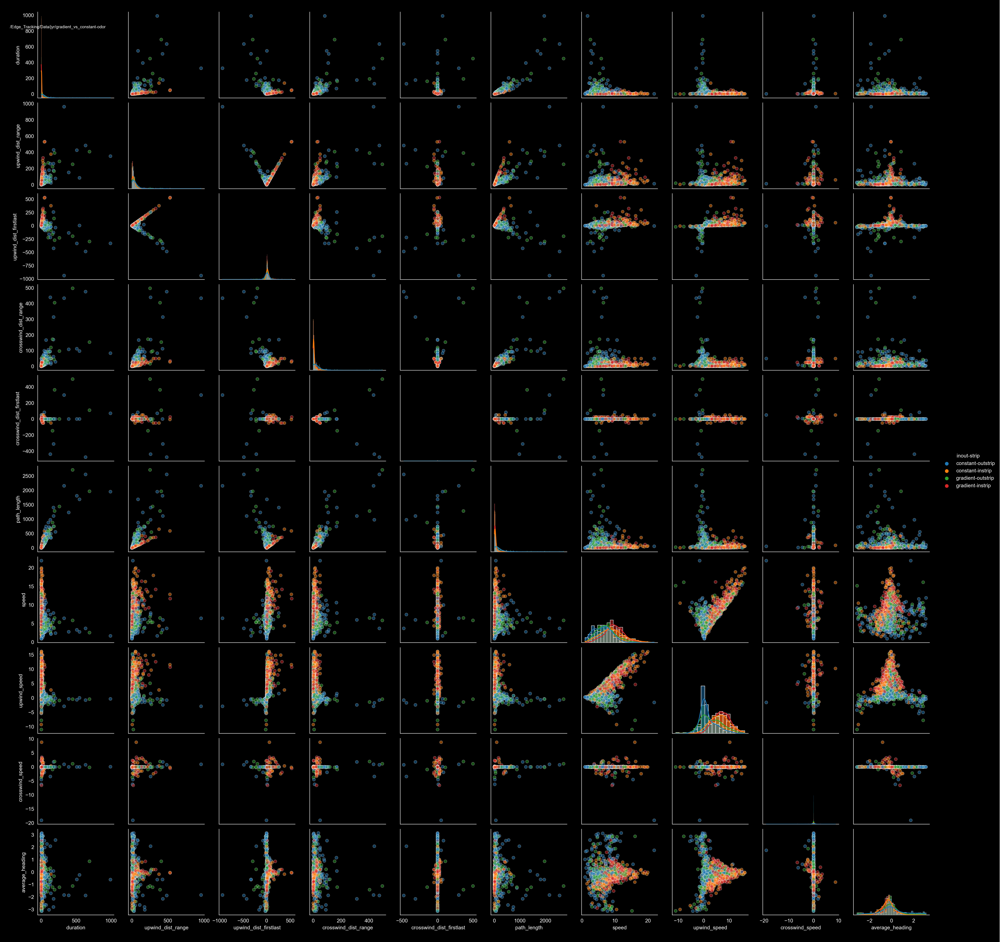

/Users/julianarhee/Documents/rutalab/data/figures/gradient_vs_constant-odor


In [252]:
plot_vars = ['duration', 'upwind_dist_range', 'upwind_dist_firstlast', \
             'crosswind_dist_range','crosswind_dist_firstlast', 'path_length']
plot_vars.extend(['speed', 'upwind_speed', 'crosswind_speed', 'average_heading'])

g = sns.pairplot(meandf, hue='inout-strip', vars=plot_vars,
                 plot_kws={'alpha': 0.5},
                diag_kind='hist', 
                 diag_kws={'common_norm': False, 'kde': True, 'stat': 'probability'})

util.label_figure(g.fig, fig_id)

pl.savefig(os.path.join(save_dir, 'pairplot2.png'), edgecolor='none')
print(save_dir)


<IPython.core.display.Javascript object>


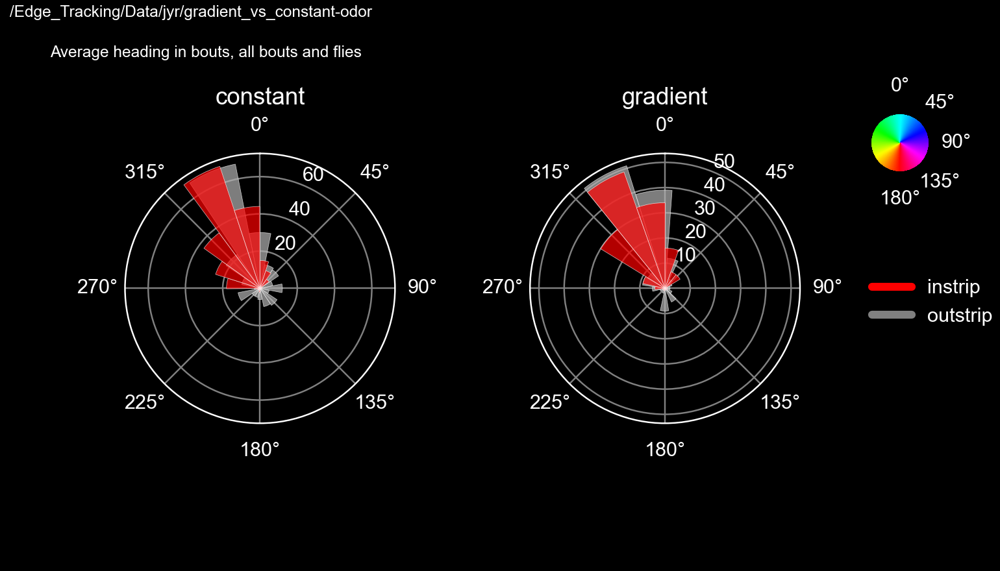

/Users/julianarhee/Documents/rutalab/data/figures/gradient_vs_constant-odor polarhist_average_heading_in_bout


In [253]:
fig, axn = pl.subplots(1, 2, figsize=(7,4), subplot_kw={'projection': 'polar'})
for ax, (strip_type, df_) in zip(axn.flat, meandf.groupby('strip_type')):
    util.circular_hist(ax, df_[~df_['instrip']]['average_heading'].values, 
                   facecolor=outstrip_c, density=False, edgecolor='w', lw=0.25)
    util.circular_hist(ax, df_[df_['instrip']]['average_heading'].values, 
                   facecolor=instrip_c, density=False,  edgecolor='w', lw=0.25)
    ax.set_title(strip_type)

labels= ['instrip', 'outstrip']
legh = util.custom_legend(labels, ['r', 'gray'])
ax.legend(handles=legh, labels=labels, bbox_to_anchor=(1.2, 0.6), loc='upper left', frameon=False)
util.add_colorwheel(fig, cmap='hsv', axes=[0.85, 0.7, 0.1, 0.1])

fig.text(0.05, 0.9, "Average heading in bouts, all bouts and flies", fontsize=8)

util.label_figure(fig, fig_id)
pl.subplots_adjust(right=0.8, wspace=0.5)
figname = 'polarhist_average_heading_in_bout'
pl.savefig(os.path.join(save_dir, '{}.png'.format(figname)))
print(save_dir, figname)

# average flies

In [255]:
flydf = meandf.groupby(['fly_id', 'inout-strip', 'condition', 'instrip', 'bout_type', 'strip_type']).mean().reset_index()
flydf.head()

/var/folders/6z/bhycp6jj4pxg1qt6h_j36h880000gn/T/ipykernel_53735/3968461528.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  flydf = meandf.groupby(['fly_id', 'inout-strip', 'condition', 'instrip', 'bout_type', 'strip_type']).mean().reset_index()


,fly_id,inout-strip,condition,instrip,bout_type,strip_type,boutnum,duration,upwind_dist_range,upwind_dist_firstlast,crosswind_dist_range,crosswind_dist_firstlast,path_length,average_heading,rel_time,speed,upwind_speed,crosswind_speed,led_on,flipped
0,20201027-fly1,constant-instrip,constantodor1,True,instrip,constant,33.0,4.599453,35.928918,34.745209,7.301760,0.748437,50.100335,-0.233380,535.456977,NaN,NaN,NaN,1.0,1.0
1,20201027-fly1,constant-instrip,constantodor2,True,instrip,constant,39.0,3.183558,22.976625,22.093734,6.686689,0.662069,33.458905,0.043198,428.565197,11.047384,7.108983,-0.076495,1.0,1.0
2,20201027-fly1,constant-outstrip,constantodor1,False,outstrip,constant,34.0,26.202091,39.881768,-6.625203,31.365615,2.521665,171.145024,0.051383,540.073472,6.870729,0.846829,-0.057847,1.0,1.0
3,20201027-fly1,constant-outstrip,constantodor2,False,outstrip,constant,40.0,19.550516,29.322907,4.329454,24.861705,0.182509,144.775940,0.658058,431.764778,8.067353,0.082685,-0.101193,1.0,1.0
4,20201027-fly1,gradient-instrip,gradient1,True,instrip,gradient,49.0,4.181091,24.049261,22.938728,7.836385,0.503075,39.327887,0.199242,657.750539,10.315651,6.304726,-0.011896,1.0,1.0


<IPython.core.display.Javascript object>


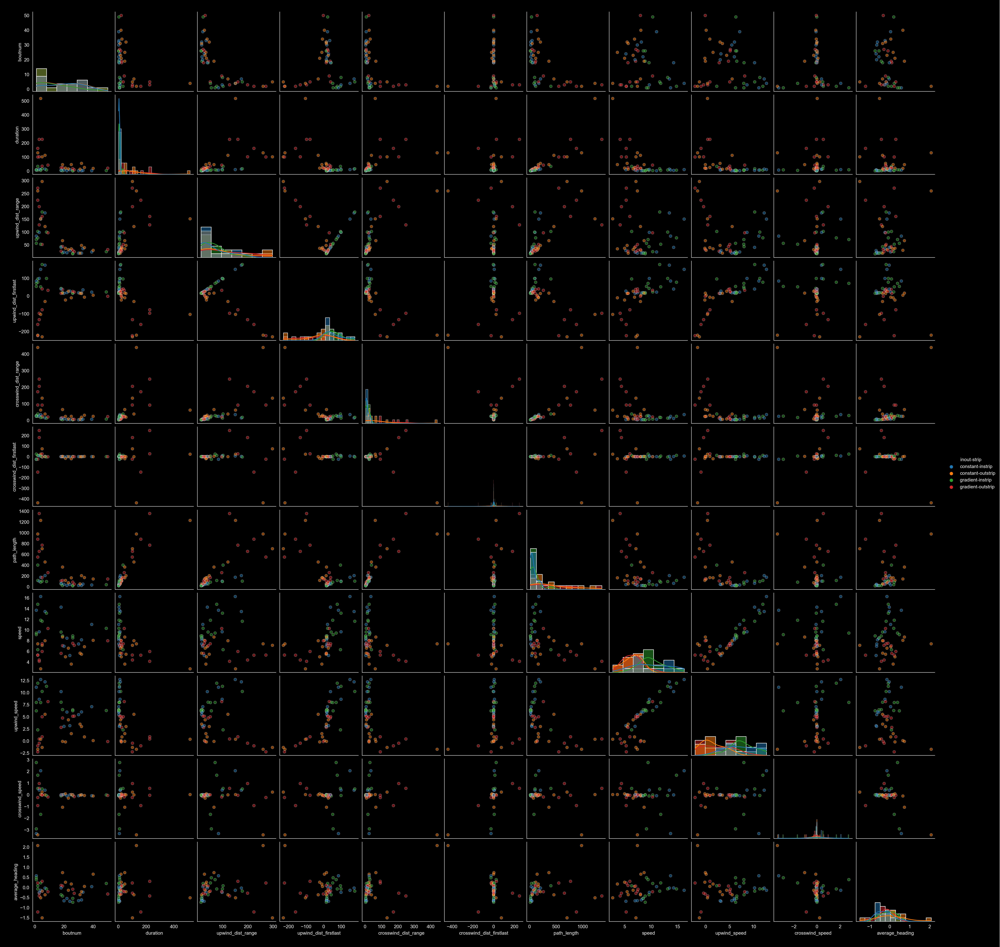

/Users/julianarhee/Documents/rutalab/data/figures/gradient_vs_constant-odor


In [256]:
#plot_vars = ['boutnum', 'duration', 'upwind_dist', 'upwind_dist_avg', 'crosswind_dist', 'path_length']
#plot_vars.extend(['speed', 'upwind_speed', 'crosswind_speed', 'average_heading'])

plot_vars = ['boutnum', 'duration', 'upwind_dist_range', 'upwind_dist_firstlast', \
             'crosswind_dist_range','crosswind_dist_firstlast', 'path_length']
plot_vars.extend(['speed', 'upwind_speed', 'crosswind_speed', 'average_heading'])


g = sns.pairplot(flydf, hue='inout-strip', vars=plot_vars, 
                plot_kws={'alpha': 0.5},
                diag_kind='hist', diag_kws={'common_norm': False, 'kde': True, 'stat': 'probability'})

pl.savefig(os.path.join(save_dir, 'pairplot_fly-avgs.png'), edgecolor='none')
print(save_dir)


In [167]:
flydf['inout-strip'].unique()

array(['constant-instrip', 'constant-outstrip', 'gradient-instrip',
       'gradient-outstrip'], dtype=object)

In [220]:
importlib.reload(butil)

<module 'behavior' from '/Users/julianarhee/Repositories/plume-tracking/behavior.py'>

<IPython.core.display.Javascript object>


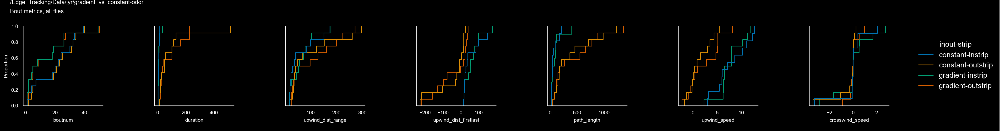

/Users/julianarhee/Documents/rutalab/data/figures/gradient_vs_constant-odor


In [272]:
hue_var='inout-strip'
row_var=None
cumulative=True
plot_type = 'ecdf' if cumulative else 'hist'
labels=flydf['inout-strip'].unique()
colors=sns.color_palette('colorblind', n_colors=4)

plot_vars = ['boutnum', 'path_length', 'duration', \
             'upwind_dist_range', 'upwind_dist_firstlast',
            'upwind_speed', 'crosswind_speed']
if cumulative:
    fig = butil.plot_metrics_displot(flydf, plot_vars, hue_var=hue_var, row_var=row_var,
                    labels=labels, colors=colors, height=2.5)
else:
    fig = butil.plot_metrics_hist(flydf, plot_vars, hue_var=hue_var, row_var=row_var,
                             labels=labels, colors=colors, cumulative=cumulative, stat=stat)
pl.tight_layout()
pl.subplots_adjust(top=0.8, right=0.9, wspace=0.3)

fig.text(0.01, 0.9, "Bout metrics, all flies", fontsize=8)


util.label_figure(fig, fig_id)

figname = '{}-metrics_averaged-fly'.format(plot_type)
pl.savefig(os.path.join(save_dir, '{}.png'.format(figname)))
print(save_dir)

In [ ]:
hue_var='inout-strip'
row_var=None
cumulative=True
plot_type = 'ecdf' if cumulative else 'hist'
labels=flydf['inout-strip'].unique()
colors=sns.color_palette('colorblind', n_colors=4)

plot_vars = ['upwind_speed', 'crosswind_speed', 'duration', \
             'upwind_dist_range', 'upwind_dist_firstlast']
if cumulative:
    fig = butil.plot_metrics_displot(flydf, plot_vars, hue_var=hue_var, row_var=row_var,
                    labels=labels, colors=colors, height=2.5)
else:
    fig = butil.plot_metrics_hist(flydf, plot_vars, hue_var=hue_var, row_var=row_var,
                             labels=labels, colors=colors, cumulative=cumulative, stat=stat)
pl.tight_layout()
pl.subplots_adjust(top=0.8, right=0.9, wspace=0.3)

fig.text(0.01, 0.9, "Bout metrics, all flies", fontsize=8)


util.label_figure(fig, fig_id)

figname = '{}-metrics_averaged-fly'.format(plot_type)
pl.savefig(os.path.join(save_dir, '{}.png'.format(figname)))
print(save_dir)

In [258]:
importlib.reload(util)

<module 'utils' from '/Users/julianarhee/Repositories/plume-tracking/utils.py'>

<IPython.core.display.Javascript object>


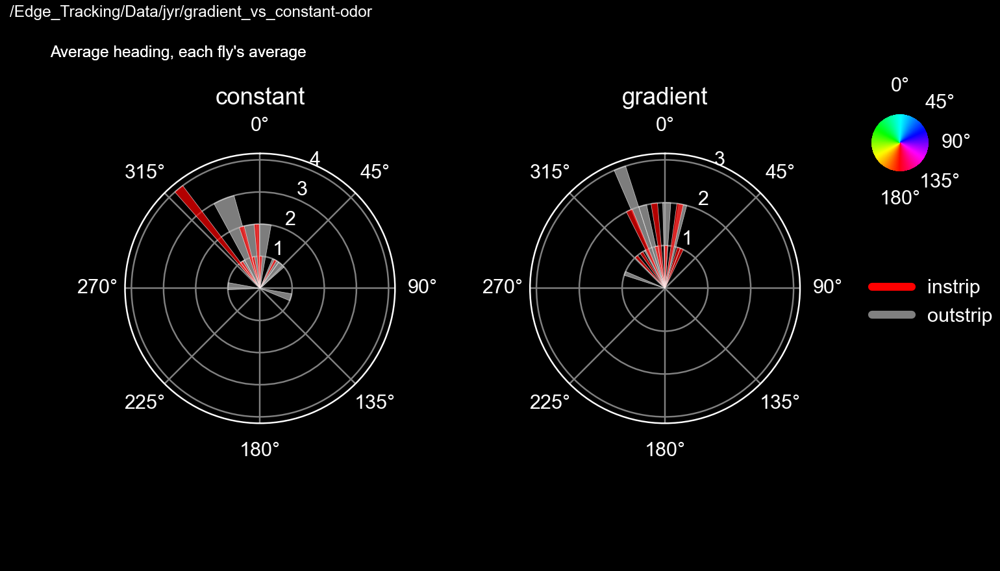

/Users/julianarhee/Documents/rutalab/data/figures/gradient_vs_constant-odor polarhist_average_heading_averaged-fly


In [259]:
fig, axn = pl.subplots(1, 2, figsize=(7,4), subplot_kw={'projection': 'polar'})
for ax, (strip_type, df_) in zip(axn.flat, flydf.groupby('strip_type')):
    util.circular_hist(ax, df_[~df_['instrip']]['average_heading'].values, 
                   facecolor=outstrip_c, density=False, edgecolor='w', lw=0.25)
    util.circular_hist(ax, df_[df_['instrip']]['average_heading'].values, 
                   facecolor=instrip_c, density=False,  edgecolor='w', lw=0.25)
    ax.set_title(strip_type)

labels= ['instrip', 'outstrip']
legh = util.custom_legend(labels, ['r', 'gray'])
ax.legend(handles=legh, labels=labels, bbox_to_anchor=(1.2, 0.6), loc='upper left', frameon=False)
util.add_colorwheel(fig, cmap='hsv', axes=[0.85, 0.7, 0.1, 0.1])

fig.text(0.05, 0.9, "Average heading, each fly's average", fontsize=8)

util.label_figure(fig, fig_id)
pl.subplots_adjust(right=0.8, wspace=0.5)
figname = 'polarhist_average_heading_averaged-fly'
pl.savefig(os.path.join(save_dir, '{}.png'.format(figname)))
print(save_dir, figname)

In [271]:
 df_[~df_['instrip']]

,fly_id,inout-strip,condition,instrip,bout_type,strip_type,boutnum,duration,upwind_dist_range,upwind_dist_firstlast,crosswind_dist_range,crosswind_dist_firstlast,path_length,average_heading,rel_time,speed,upwind_speed,crosswind_speed,led_on,flipped
6,20201027-fly1,gradient-outstrip,gradient1,False,outstrip,gradient,50.0,21.203371,32.279767,-1.664529,23.159457,0.193909,144.633064,-0.324644,661.948524,7.988066,-0.108259,-0.051848,1.0,1.0
7,20201027-fly1,gradient-outstrip,gradient2,False,outstrip,gradient,3.0,226.114734,128.181090,-96.922358,249.009917,248.426523,1358.673811,-0.420680,46.708996,4.142975,0.416479,0.553240,1.0,0.0
14,20201027-fly2,gradient-outstrip,gradient1,False,outstrip,gradient,18.0,24.513609,25.798547,15.120780,14.105240,0.005114,108.296591,0.102426,229.398389,5.621373,2.810269,-0.007992,1.0,1.0
15,20201027-fly2,gradient-outstrip,gradient2,False,outstrip,gradient,19.0,24.191482,43.946451,37.428179,16.571828,0.009928,117.380954,0.071125,363.563577,7.070725,4.756174,-0.004562,1.0,1.0
22,20201027-fly3,gradient-outstrip,gradient1,False,outstrip,gradient,3.0,102.039612,199.128130,-132.766110,205.488466,181.486494,656.545817,-0.281179,16.699209,4.387400,-0.455115,0.965656,1.0,0.0
23,20201027-fly3,gradient-outstrip,gradient2,False,outstrip,gradient,2.0,100.785278,271.241894,-222.919003,92.952079,-23.929025,551.089298,0.222132,9.896609,5.313466,-2.245664,-0.229774,1.0,0.0
30,20201028-fly5,gradient-outstrip,gradient1,False,outstrip,gradient,5.0,35.670950,52.216292,39.824288,25.198737,0.000936,172.463387,-0.182522,116.815249,7.429282,5.018222,0.000361,1.0,1.0
31,20201028-fly5,gradient-outstrip,gradient2,False,outstrip,gradient,9.0,42.841415,97.424084,32.017838,20.981435,-0.560962,262.543971,-0.210865,207.327553,10.287570,8.156578,-0.184221,1.0,0.0
38,20201028-fly7,gradient-outstrip,gradient1,False,outstrip,gradient,27.0,9.479232,24.019932,22.204566,6.282377,0.098637,49.822587,-0.290807,195.047251,7.136260,5.147066,-0.151816,1.0,1.0
39,20201028-fly7,gradient-outstrip,gradient2,False,outstrip,gradient,26.0,17.644194,29.249969,25.583438,7.233662,-0.009158,86.825671,-0.087766,358.474115,7.521729,5.124571,-0.001675,1.0,1.0


In [260]:
flydf.columns

Index(['fly_id', 'inout-strip', 'condition', 'instrip', 'bout_type',
       'strip_type', 'boutnum', 'duration', 'upwind_dist_range',
       'upwind_dist_firstlast', 'crosswind_dist_range',
       'crosswind_dist_firstlast', 'path_length', 'average_heading',
       'rel_time', 'speed', 'upwind_speed', 'crosswind_speed', 'led_on',
       'flipped'],
      dtype='object')

<IPython.core.display.Javascript object>


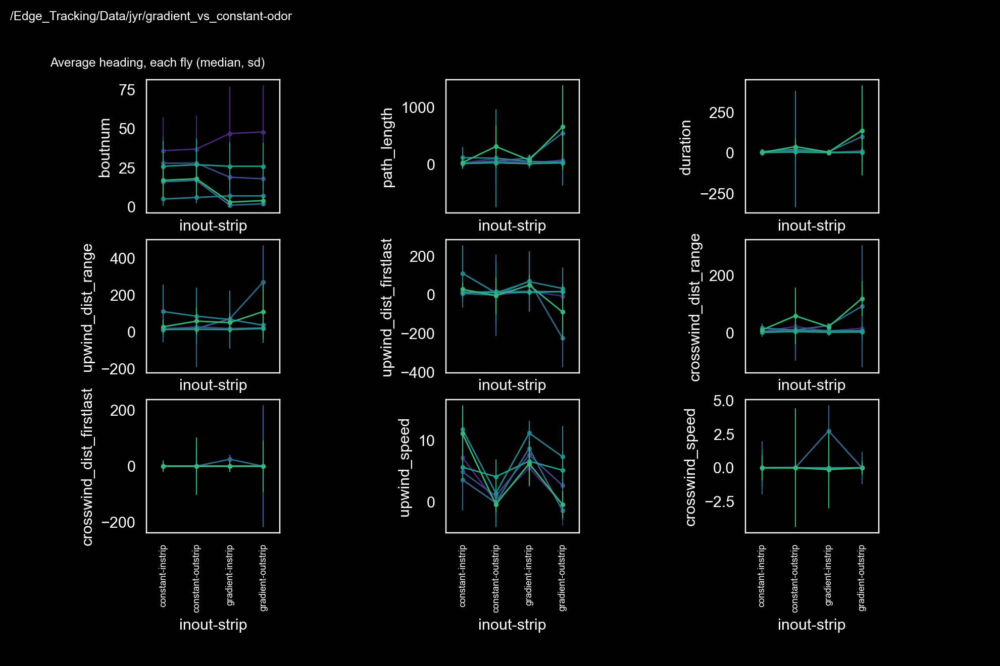

In [267]:
#plot_vars = ['path_length', 'duration', 'upwind_speed', 'crosswind_speed']
cmap = sns.color_palette('viridis', n_colors=8)
plot_vars = ['boutnum', 'path_length', 'duration', 'upwind_dist_range', 'upwind_dist_firstlast', \
             'crosswind_dist_range', 'crosswind_dist_firstlast']
plot_vars.extend([ 'upwind_speed', 'crosswind_speed'])
     
estimator = 'median'
errorbar = 'sd'
fig.text(0.05, 0.9, "Average heading, each fly's average", fontsize=8)

fig, axn = pl.subplots(3, 3, figsize=(9,6), sharex=True)
for pi, pvar in enumerate(plot_vars):
    ax=axn.flat[pi]
    sns.pointplot(data=metrics, x='inout-strip', y=pvar, ax=ax, hue='fly_id', palette=cmap,
                  scale=0.35, errwidth=0.7, join=True, 
                  estimator=estimator, errorbar=errorbar) #('ci', 95))
    ax.legend_.remove()# legend=False)
    ax.set_box_aspect(1)
    #ax.set_title(pvar)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, fontsize=6)
pl.subplots_adjust(wspace=0.7, bottom=0.2)

fig.text(0.05, 0.9, "Average heading, each fly ({}, {})".format(estimator, errorbar), fontsize=8)

util.label_figure(fig, fig_id)
figname = 'metics_paired_by_fly_allconds_{}-{}'.format(estimator, errorbar)
pl.savefig(os.path.join(save_dir, '{}.png'.format(figname)))

# across time

In [263]:
df0.columns

Index(['timestamp -- motor_step_command', 'mfc1_stpt', 'mfc2_stpt',
       'mfc3_stpt', 'led1_stpt', 'led2_stpt', 'ft_posx', 'ft_posy',
       'ft_heading', 'ft_frame', 'ft_error', 'ft_roll', 'ft_pitch', 'ft_yaw',
       'filename', 'timestamp', 'motor_step_command', 'time', 'rel_time',
       'date', 'instrip', 'led_on', 'experiment', 'fly_name', 'condition',
       'trial', 'fly_id', 'trial_id', 'boutnum', 'cum_time', 'speed',
       'upwind_speed', 'crosswind_speed', 'euclid_dist', 'upwind_dist',
       'crosswind_dist', 'flipped', 'strip_type', 'bout_type', 'inout-strip'],
      dtype='object')

In [960]:
df0.loc[df0['condition'].isin(['constantodor1', 'constantodor2']), 'strip_type'] = 'constant'
df0.loc[df0['condition'].isin(['gradient1', 'gradient2']), 'strip_type'] = 'gradient'

df0.loc[df0['instrip'], 'bout_type'] = 'instrip'
df0.loc[~df0['instrip'], 'bout_type'] = 'outstrip'
df0['inout-strip'] = ['{}-{}'.format(v1, v2) for v1, v2 \
                         in df0[['strip_type', 'bout_type']].values]

In [961]:
df0.columns

Index(['timestamp -- motor_step_command', 'mfc1_stpt', 'mfc2_stpt',
       'mfc3_stpt', 'led1_stpt', 'led2_stpt', 'ft_posx', 'ft_posy',
       'ft_heading', 'ft_frame', 'ft_error', 'ft_roll', 'ft_pitch', 'ft_yaw',
       'filename', 'timestamp', 'motor_step_command', 'time', 'rel_time',
       'date', 'instrip', 'led_on', 'experiment', 'fly_name', 'condition',
       'trial', 'fly_id', 'trial_id', 'boutnum', 'cum_time', 'speed',
       'upwind_speed', 'crosswind_speed', 'euclid_dist', 'upwind_dist',
       'crosswind_dist', 'flipped', 'strip_type', 'bout_type', 'inout-strip'],
      dtype='object')

In [962]:
# ibi = df_fp.groupby(['trial_id', 'boutnum', 'instrip']).first()['rel_time'].diff().reset_index()
# ibi.loc[ibi['boutnum']==1, 'rel_time'] = np.nan
# ibi = ibi.rename(columns={'rel_time': 'duration'})
grouper = ['trial_id', 'boutnum', 'instrip', 'inout-strip', 'condition', 'bout_type', 'strip_type']
ibi = (df0.groupby(grouper)['time'].last() \
        - df0.groupby(grouper)['time'].first()).reset_index()
ibi = ibi.rename(columns={'time': 'duration'})
ibi['time'] = df0.groupby(grouper).first()['rel_time'].values
# ibi.loc[ibi['instrip'], 'bouttype'] = 'instrip'
# ibi.loc[~ibi['instrip'], 'bouttype'] = 'outstrip'

In [963]:
d_list = []
for trial_id, df_ in ibi.groupby('trial_id'):
    start_bout = sorted(df_[~df_['instrip']]['boutnum'].unique())[0]
    if start_bout == 1:
        start_bout = sorted(df_[~df_['instrip']]['boutnum'].unique())[1]
    end_bout = sorted(df_[df_['instrip']]['boutnum'].unique())[-1]
    incl_bouts = [b for b in df_['boutnum'].unique() if b>=start_bout and b<=end_bout]
    d_list.append(df_[df_['boutnum'].isin(incl_bouts)])
midbouts = pd.concat(d_list)  

In [964]:
importlib.reload(util)

<module 'utils' from '/Users/julianarhee/Repositories/plume-tracking/utils.py'>

<IPython.core.display.Javascript object>


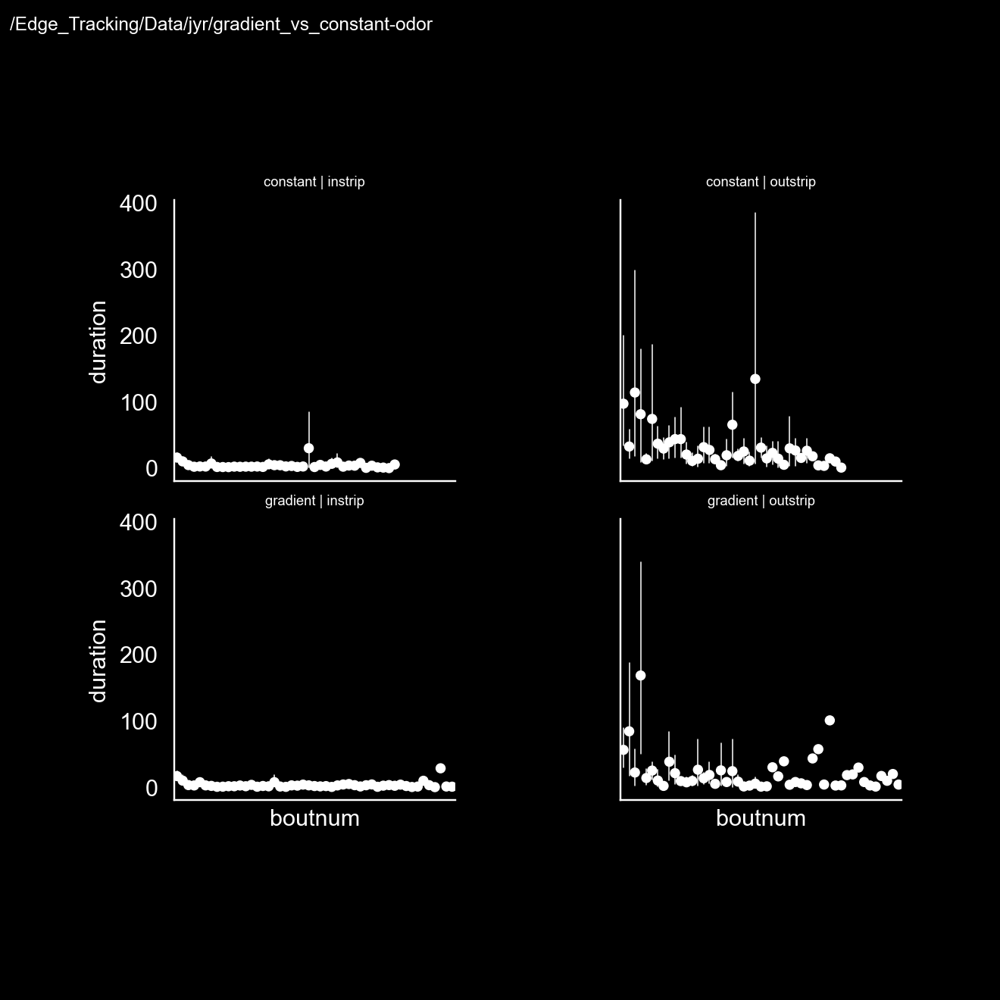

In [965]:
out_to_in = ibi[ibi['instrip']].copy()
in_to_out = ibi[~ibi['instrip']].copy()
# ---
plot_individuals=False
xvar='boutnum'
yvar='duration'

trial_ids=ibi['trial_id'].unique()
g = sns.FacetGrid(data=ibi, col='bout_type', row='strip_type', height=3)
g.map_dataframe(sns.pointplot, x=xvar, y=yvar,
                palette=['w'], errwidth=0.5, scale=0.5)
g.set_titles(row_template = '{row_name}', col_template = '{col_name}', size=6)
for ai, ax in enumerate(g.axes.flat):
    ax.set_box_aspect(1)
    for label in ax.xaxis.get_ticklabels()[0:]:
        label.set_visible(False)
pl.subplots_adjust(top=0.8, bottom=0.2)
util.label_figure(g.fig, fig_id)

In [895]:
for trial_id, df_ in midbouts.groupby('trial_id'):
    midbouts.loc[df_.index, 'time_normed'] = df_['time']/df_['time'].max()

In [896]:
midbouts

,trial_id,boutnum,instrip,inout-strip,condition,bout_type,strip_type,duration,time,time_normed
1,20201027-fly1_10272020-155449,2,False,constant-outstrip,constantodor1,outstrip,constant,0.749824,7.560720,0.007876
2,20201027-fly1_10272020-155449,3,True,constant-instrip,constantodor1,instrip,constant,1.546513,8.326165,0.008674
3,20201027-fly1_10272020-155449,4,False,constant-outstrip,constantodor1,outstrip,constant,19.776610,9.888303,0.010301
4,20201027-fly1_10272020-155449,5,True,constant-instrip,constantodor1,instrip,constant,3.030544,29.696155,0.030935
5,20201027-fly1_10272020-155449,6,False,constant-outstrip,constantodor1,outstrip,constant,49.877482,32.742316,0.034108
...,...,...,...,...,...,...,...,...,...,...
772,20201028-fly8_10282020-222155,3,True,gradient-instrip,gradient1,instrip,gradient,5.514322,65.297201,0.289708
773,20201028-fly8_10282020-222155,4,False,gradient-outstrip,gradient1,outstrip,gradient,14.496602,70.827144,0.314243
774,20201028-fly8_10282020-222155,5,True,gradient-instrip,gradient1,instrip,gradient,1.171590,85.355000,0.378700
775,20201028-fly8_10282020-222155,6,False,gradient-outstrip,gradient1,outstrip,gradient,138.816306,86.542210,0.383967


<IPython.core.display.Javascript object>


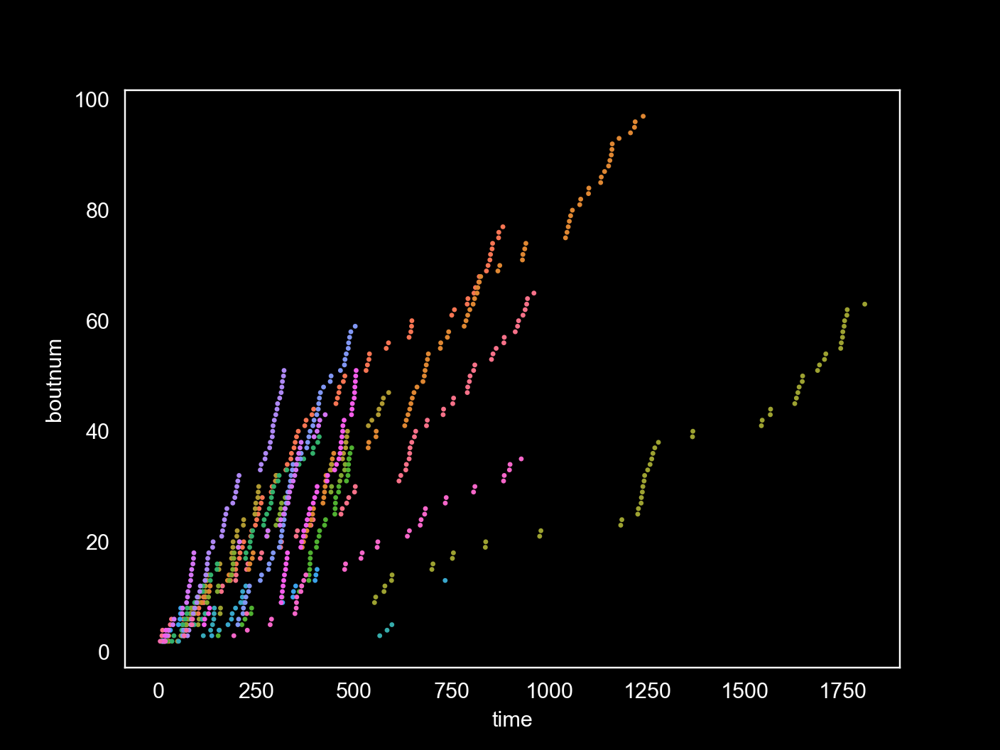

In [897]:
fig, ax = pl.subplots()

ax = sns.scatterplot(data=midbouts, x='time', y='boutnum', ax=ax, 
                edgecolor='none', s=5, hue='trial_id', legend=False)
#ax.set(yscale ='log')
#ax.set_xlim([0, 100])

In [966]:
# metrics = df0.groupby(['fly_id', 'condition', 'boutnum']).apply(get_bout_metrics).reset_index()
df0.columns

Index(['timestamp -- motor_step_command', 'mfc1_stpt', 'mfc2_stpt',
       'mfc3_stpt', 'led1_stpt', 'led2_stpt', 'ft_posx', 'ft_posy',
       'ft_heading', 'ft_frame', 'ft_error', 'ft_roll', 'ft_pitch', 'ft_yaw',
       'filename', 'timestamp', 'motor_step_command', 'time', 'rel_time',
       'date', 'instrip', 'led_on', 'experiment', 'fly_name', 'condition',
       'trial', 'fly_id', 'trial_id', 'boutnum', 'cum_time', 'speed',
       'upwind_speed', 'crosswind_speed', 'euclid_dist', 'upwind_dist',
       'crosswind_dist', 'flipped', 'strip_type', 'bout_type', 'inout-strip'],
      dtype='object')

In [967]:
#tpoints = df0.groupby(['fly_id', 'condition', 'boutnum']).first()['rel_time'].reset_index()

In [991]:
#metrics1 = pd.merge(metrics, tpoints)
#metrics1

In [1017]:
tmin, tmax = metrics['rel_time'].min(), metrics['rel_time'].max()
bins = np.arange(tmin, tmax, 10)
bins

array([   0.,   10.,   20.,   30.,   40.,   50.,   60.,   70.,   80.,
         90.,  100.,  110.,  120.,  130.,  140.,  150.,  160.,  170.,
        180.,  190.,  200.,  210.,  220.,  230.,  240.,  250.,  260.,
        270.,  280.,  290.,  300.,  310.,  320.,  330.,  340.,  350.,
        360.,  370.,  380.,  390.,  400.,  410.,  420.,  430.,  440.,
        450.,  460.,  470.,  480.,  490.,  500.,  510.,  520.,  530.,
        540.,  550.,  560.,  570.,  580.,  590.,  600.,  610.,  620.,
        630.,  640.,  650.,  660.,  670.,  680.,  690.,  700.,  710.,
        720.,  730.,  740.,  750.,  760.,  770.,  780.,  790.,  800.,
        810.,  820.,  830.,  840.,  850.,  860.,  870.,  880.,  890.,
        900.,  910.,  920.,  930.,  940.,  950.,  960.,  970.,  980.,
        990., 1000., 1010., 1020., 1030., 1040., 1050., 1060., 1070.,
       1080., 1090., 1100., 1110., 1120., 1130., 1140., 1150., 1160.,
       1170., 1180., 1190., 1200., 1210., 1220., 1230., 1240., 1250.,
       1260., 1270.,

In [1018]:
 # cut time axis into bins, count N bouts

In [1019]:
labels = bins[1:]
df0['time_bin'] = pd.cut(df0['rel_time'], bins=bins, labels=labels)
df0.head()

,timestamp -- motor_step_command,mfc1_stpt,mfc2_stpt,mfc3_stpt,led1_stpt,led2_stpt,ft_posx,ft_posy,ft_heading,ft_frame,...,upwind_speed,crosswind_speed,euclid_dist,upwind_dist,crosswind_dist,flipped,strip_type,bout_type,inout-strip,time_bin
0,10/27/2020-15:54:49.956883 -- 800003,0.780781,0.0,0.195195,0.0,0.0,0.051928,0.105608,0.031190,2,...,inf,-inf,NaN,NaN,NaN,True,constant,instrip,constant-instrip,NaN
1,10/27/2020-15:54:49.956883 -- 800007,0.780781,0.0,0.195195,0.0,1.0,0.068331,0.202869,0.059847,3,...,5.773710,-5.244269,0.098635,0.097261,0.016404,True,constant,instrip,constant-instrip,NaN
2,10/27/2020-15:54:49.988120 -- 800010,0.780781,0.0,0.195195,0.0,1.0,0.215744,0.285963,0.084223,4,...,0.051907,-6.018932,0.169218,0.083093,0.147412,True,constant,instrip,constant-instrip,10.0
3,10/27/2020-15:54:50.003740 -- 800013,0.780781,0.0,0.195195,0.0,0.0,0.350361,0.205302,0.106119,5,...,0.448468,-6.687237,0.156933,-0.080661,0.134617,True,constant,instrip,constant-instrip,10.0
4,10/27/2020-15:54:50.019361 -- 800016,0.780781,0.0,0.195195,0.0,0.0,0.424659,0.299973,0.127977,6,...,6.257460,-4.879529,0.120345,0.094672,0.074298,True,constant,instrip,constant-instrip,10.0


In [1020]:
# grouper = [ 'trial_id',  'boutnum', 'strip_type',\
#            'bout_type', 'inout-strip']
# grouper.append('time_bin')

ign_cols = ['experiment', 'fly_name', 'trial', 'motor_step_command', 'led2_stpt', 'level_3',
           'mfc1_stpt', 'mfc2_stpt', 'mfc3_stpt', 'led1_stpt', 'date']
quant_cols = [c for c in metrics1.columns if c not in ign_cols]

quant_grouper = ['fly_id', 'trial_id', 'instrip', 'condition', \
                 'strip_type', 'bout_type', 'inout-strip', 'boutnum']
# meandf = metrics[quant_cols].groupby(quant_grouper).mean().reset_index()


In [1021]:
df0.columns

Index(['timestamp -- motor_step_command', 'mfc1_stpt', 'mfc2_stpt',
       'mfc3_stpt', 'led1_stpt', 'led2_stpt', 'ft_posx', 'ft_posy',
       'ft_heading', 'ft_frame', 'ft_error', 'ft_roll', 'ft_pitch', 'ft_yaw',
       'filename', 'timestamp', 'motor_step_command', 'time', 'rel_time',
       'date', 'instrip', 'led_on', 'experiment', 'fly_name', 'condition',
       'trial', 'fly_id', 'trial_id', 'boutnum', 'cum_time', 'speed',
       'upwind_speed', 'crosswind_speed', 'euclid_dist', 'upwind_dist',
       'crosswind_dist', 'flipped', 'strip_type', 'bout_type', 'inout-strip',
       'time_bin'],
      dtype='object')

In [1023]:
grouper = ['fly_id', 'trial_id', 'instrip', 'condition', \
                 'strip_type', 'bout_type', 'inout-strip', 'time_bin']
df0.groupby(grouper)['boutnum'].count() #mean().reset_index()


fly_id         trial_id                       instrip  condition      strip_type  bout_type  inout-strip        time_bin
20201027-fly1  20201027-fly1_10272020-155449  False    constantodor1  constant    instrip    constant-instrip   10.0        0
                                                                                                                20.0        0
                                                                                                                30.0        0
                                                                                                                40.0        0
                                                                                                                50.0        0
                                                                                                                           ..
20201028-fly8  20201028-fly8_10282020-224125  True     gradient2      gradient    outstrip   gradient-outstrip  1760.0     

In [1001]:
metrics[metrics['trial_id']=='20201027-fly3_10272020-211853'].groupby(['instrip', 'boutnum']).mean()

/var/folders/6z/bhycp6jj4pxg1qt6h_j36h880000gn/T/ipykernel_10153/3893000844.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  metrics[metrics['trial_id']=='20201027-fly3_10272020-211853'].groupby(['instrip', 'boutnum']).mean()


level_3
instrip boutnum         
False   2            0.0
        4            0.0
        6            0.0
        8            0.0
True    1            0.0
        3            0.0
        5            0.0
        7            0.0